In [2]:
import sympy as sp  # Symbolic derivation library
from sympy.physics.vector import init_vprinting

init_vprinting()  # enable LaTeX-style printing

import matplotlib.pyplot as plt  # For plotting results

plt.rcParams["animation.html"] = "jshtml"

In [3]:
# Lagrangian → Equation of motion → Numerical integration → Animation

### Derivation of Equation of Motion via SymPy

In [4]:
# Problem Setup: Define State Space Dimensions

# Input Dimensions
t, m, l, g, b = sp.symbols('t m l g b') # Time, Mass, Length, Gravity, Damping

# Generalized Coordinate | Output Dimension
theta = sp.Function('theta')(t) # Angle of the pendulum as a function of time

In [5]:
# Compute Velocity
theta_dot = sp.diff(theta, t) # First derivative of theta with respect to time

In [6]:
# Compute Potential Energy
V = m * g * l * (1 - sp.cos(theta))

# Compute Kinetic Energy
T = (1/2) * m * l**2 * theta_dot**2

# Compute Lagrangian
L = T - V
L

In [7]:
# Compute derivatives for Lagrange's equation
dL_dtheta = sp.diff(L, theta)
dL_dtheta_dot = sp.diff(L, theta_dot)
d_dt_dL_dtheta_dot = sp.diff(dL_dtheta_dot, t)

# Compute non-conservative friction force (Damping)
Q_nc = -b * theta_dot
Q_nc

In [8]:
# Lagrange's Equation: d/dt(dL/dtheta_dot) - dL/dtheta = 0
lagrange_eq = sp.Eq(d_dt_dL_dtheta_dot - dL_dtheta - Q_nc, 0)

# Simplify the equation
sp.simplify(lagrange_eq)

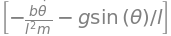

In [9]:
# Solve for the second derivative of theta (angular acceleration)
theta_double_dot = sp.symbols('theta_double_dot')
solution = sp.solve(lagrange_eq, sp.diff(theta, (t, 2)))
solution

In [10]:
# Convert to numerical function for simulation
theta_double_dot_func = sp.lambdify((theta, theta_dot, m, l, g, b), solution[0], 'numpy')  

### Animating Simulation

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

g = 9.81
l = 1.0
m = 1.0
b = 0.2

def pendulum(t, y):
    theta, omega = y
    
    dtheta = omega
    domega = -(g/l)*np.sin(theta) - (b/(m*l*l))*omega
    
    return [dtheta, domega]

y0 = [2.5, 0.0]  # initial angle, velocity

t = np.linspace(0, 10, 1000)

sol = solve_ivp(pendulum, [0,10], y0, t_eval=t)

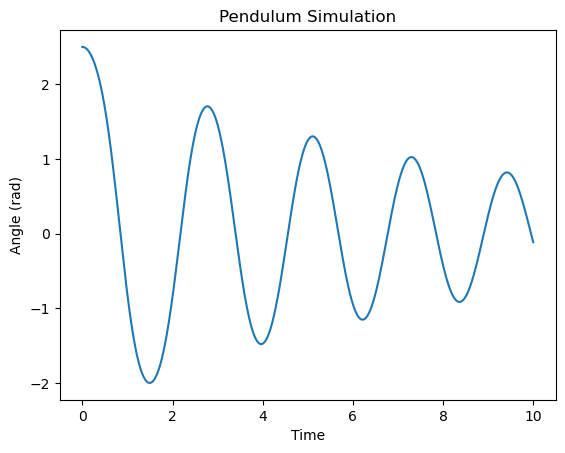

In [24]:
plt.plot(sol.t, sol.y[0])
plt.xlabel("Time")
plt.ylabel("Angle (rad)")
plt.title("Pendulum Simulation")
plt.show()

In [25]:
theta = sol.y[0]

x = l * np.sin(theta)
y = -l * np.cos(theta)

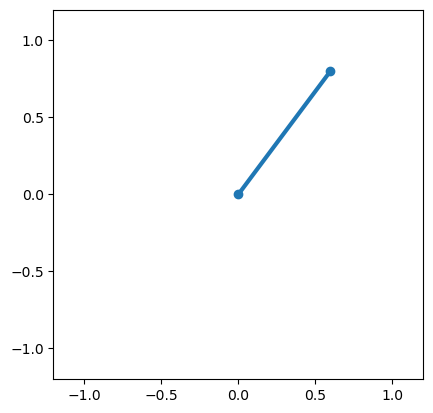

In [26]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots()
ax.set_xlim(-1.2,1.2)
ax.set_ylim(-1.2,1.2)
ax.set_aspect('equal')

line, = ax.plot([], [], 'o-', lw=3)

def update(i):
    line.set_data([0, x[i]], [0, y[i]])
    return line,

ani = FuncAnimation(fig, update, frames=len(t), interval=10)

HTML(ani.to_jshtml())